# Advertising Company

Представим, что международное круизное агентство Carnival Cruise Line решило себя разрекламировать с помощью баннеров и обратилось для этого к вам. Чтобы протестировать, велика ли от таких баннеров польза, их будет размещено всего 20 штук по всему миру. Вам надо выбрать 20 таких локаций для размещения, чтобы польза была большой и агентство продолжило с вами сотрудничать.

Агентство крупное, и у него есть несколько офисов по всему миру. Вблизи этих офисов оно и хочет разместить баннеры — легче договариваться и проверять результат. Также эти места должны быть популярны среди туристов.

Для поиска оптимальных мест воспользуемся базой данных крупнейшей социальной сети, основанной на локациях — Foursquare.

Часть открытых данных есть, например, на сайте [archive.org](https://archive.org/details/201309_foursquare_dataset_umn )

Нас будет интересовать файл checkins.dat.

Для удобной работы с этим документом преобразуем его к формату csv, удалив строки, не содержащие координат — они неинформативны для нас:

С помощью pandas построим DataFrame и убедимся, что все 396634 строки с координатами считаны успешно.

In [1]:
# Импорт необходимых библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
import random

Распарсим исходный файл и создадим на его основе DataFrame:

In [2]:
file = open('checkins.dat')
columns = file.readline().strip('\n').split('|')
columns = list(map(lambda x: x.strip(), columns))
file.readline()
data = []
for line in file:
    data.append(list(map(lambda x: x.strip(), line.strip('\n').split('|'))))
df = pd.DataFrame(data, columns = columns)

Посмотрим на полученный DataFrame:

In [3]:
df.head(5)

,id,user_id,venue_id,latitude,longitude,created_at
0,984301,2041916,5222,,,2012-04-21 17:39:01
1,984222,15824,5222,38.8951118,-77.0363658,2012-04-21 17:43:47
2,984315,1764391,5222,,,2012-04-21 17:37:18
3,984234,44652,5222,33.800745,-84.41052,2012-04-21 17:43:43
4,984249,2146840,5222,,,2012-04-21 17:42:58


In [4]:
df.tail(5)

,id,user_id,venue_id,latitude,longitude,created_at
1021963,956447,2088020,4432,,,2012-04-13 12:58:05
1021964,956733,960666,60,42.331427,-83.0457538,2012-04-13 21:56:19
1021965,957139,1771518,10935,,,2012-04-14 02:44:52
1021966,(1021966 rows),None,None,None,None,None
1021967,,None,None,None,None,None


Размер данных:

In [5]:
df.shape

(1021968, 6)

Для корректной работы алгоритма классификации необходимо удалить пропуски данных:

In [6]:
df = df[(df['latitude'] != '') & (df['longitude'] != '')].dropna()

Посмотрим на полученный DataFrame:

In [7]:
df.head(5)

,id,user_id,venue_id,latitude,longitude,created_at
1,984222,15824,5222,38.8951118,-77.0363658,2012-04-21 17:43:47
3,984234,44652,5222,33.800745,-84.41052,2012-04-21 17:43:43
7,984291,105054,5222,45.5234515,-122.6762071,2012-04-21 17:39:22
9,984318,2146539,5222,40.764462,-111.904565,2012-04-21 17:35:46
10,984232,93870,380645,33.4483771,-112.0740373,2012-04-21 17:38:18


In [8]:
df.tail(5)

,id,user_id,venue_id,latitude,longitude,created_at
1021959,955561,626076,20073,40.8501002,-73.8662464,2012-04-13 09:56:48
1021960,955892,674797,2297,33.7489954,-84.3879824,2012-04-13 10:56:03
1021961,956377,845102,11195,42.7653662,-71.467566,2012-04-13 12:08:45
1021962,956119,1139114,29488,42.439479,-83.7438303,2012-04-13 11:36:44
1021964,956733,960666,60,42.331427,-83.0457538,2012-04-13 21:56:19


Размер данных:

In [9]:
df.shape

(396634, 6)

## Кластеризация

Теперь необходимо кластеризовать данные координаты, чтобы выявить центры скоплений туристов. Поскольку баннеры имеют сравнительно небольшую площадь действия, нам нужен алгоритм, позволяющий ограничить размер кластера и не зависящий от количества кластеров.

Эта задача — хороший повод познакомиться с алгоритмом MeanShift, который мы обошли стороной в основной части лекций. Его описание при желании можно посмотреть в sklearn user guide, а чуть позже появится дополнительное видео с обзором этого и некоторых других алгоритмов кластеризации. Используйте MeanShift, указав bandwidth=0.1, что в переводе из градусов в метры колеблется примерно от 5 до 10 км в средних широтах.

Примечание: на 396634 строках кластеризация будет работать долго. Быть очень терпеливым не возбраняется — результат от этого только улучшится. Но для того, чтобы сдать задание, понадобится сабсет из первых 100 тысяч строк. Это компромисс между качеством и затраченным временем. Обучение алгоритма на всём датасете занимает около часа, а на 100 тыс. строк — примерно 2 минуты, однако этого достаточно для получения корректных результатов.

Некоторые из получившихся кластеров содержат слишком мало точек — такие кластеры не интересны рекламодателям. Поэтому надо определить, какие из кластеров содержат, скажем, больше 15 элементов. Центры этих кластеров и являются оптимальными для размещения.

Создадим DataFrame для кластеризации:

In [10]:
dfc = df[['latitude', 'longitude']].applymap(float)[:100000]

Посмотрим на полученный DataFrame:

In [11]:
dfc.head(5)

,latitude,longitude
1,38.895112,-77.036366
3,33.800745,-84.410520
7,45.523452,-122.676207
9,40.764462,-111.904565
10,33.448377,-112.074037


Размер данных:

In [12]:
dfc.shape

(100000, 2)

Визуализируем исходные данные:

In [13]:
maps = folium.Map(tiles = 'CartoDB dark_matter')
lat = dfc['latitude'][:10000]
lon = dfc['longitude'][:10000]
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius = 1).add_to(maps)
maps.save('mapData.html')
maps

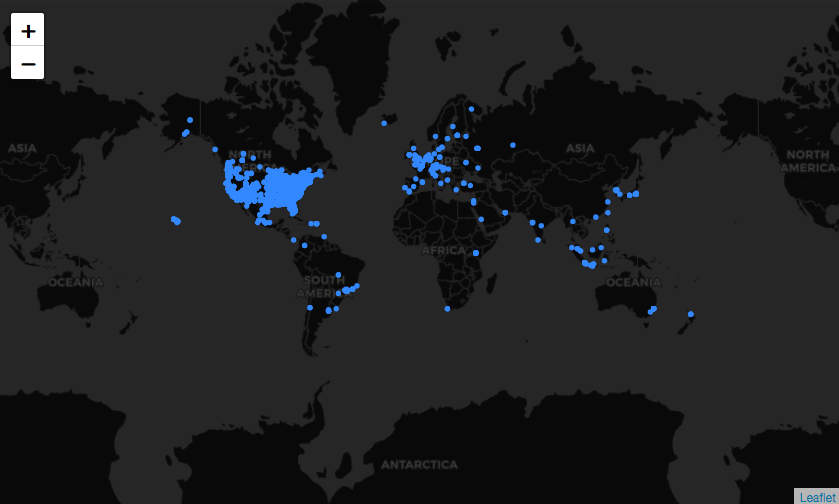

In [1]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
from IPython.display import Image
Image('data.png')

### Классификация MeanShift

In [14]:
from sklearn.cluster import MeanShift

Модель:

In [15]:
%%time
model = MeanShift(bandwidth = 0.1)
model.fit(dfc)
predict = model.predict(dfc)

CPU times: user 5min 33s, sys: 6.97 s, total: 5min 40s
Wall time: 5min 54s


Полученные кластеры:

In [16]:
labels = model.labels_
labels

array([ 5,  7, 30, ..., 25, 19,  4])

Центры кластеров:

In [17]:
centers = model.cluster_centers_
centers = pd.DataFrame(centers, columns=['center latitude', 'center longitude'])
centers.head(5)

,center latitude,center longitude
0,40.717716,-73.991835
1,33.449438,-112.002140
2,33.446380,-111.901888
3,41.878244,-87.629843
4,37.688682,-122.409330


Визуализируем центры кластеров:

In [18]:
maps = folium.Map(tiles = 'CartoDB dark_matter')
lat = centers['center latitude']
lon = centers['center longitude']
for lat, lon in zip(lat, lon):
    folium.CircleMarker(
        location=[lat, lon],
        radius = 1,
        color="#%03x" % random.randint(0, 0xFFF)
    ).add_to(maps)
maps.save('mapCenterClasster.html')
maps

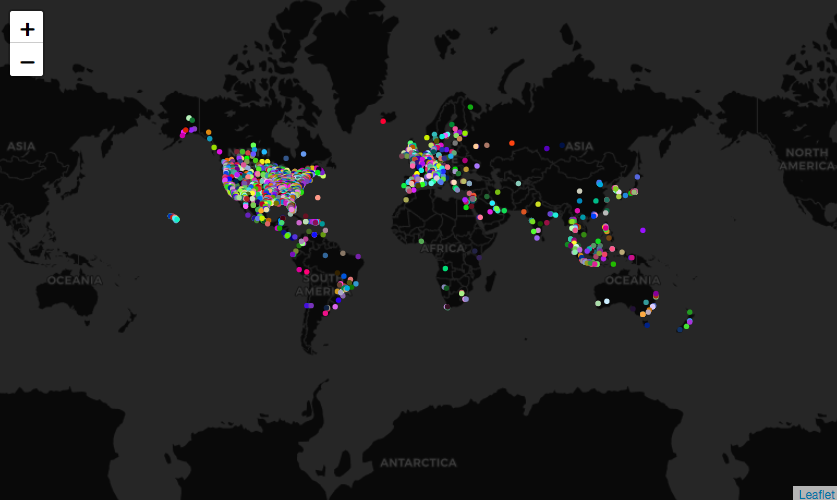

In [2]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('centers.png')

Добавим в анализируемые данные метки кластеров и их обьем:

In [19]:
cluster, volume = np.unique(labels, return_counts=True)

In [20]:
cluster = pd.Series(cluster)
cluster.head(5)

0    0
1    1
2    2
3    3
4    4
dtype: int64

In [21]:
volume = pd.Series(volume)
volume.head(5)

0    12506
1     4692
2     3994
3     3363
4     3526
dtype: int64

In [22]:
dfc['cluster'] = labels
dfc['volume'] = dfc['cluster'].map(volume)
dfc['center latitude'] = dfc['cluster'].map(centers['center latitude'])
dfc['center longitude'] = dfc['cluster'].map(centers['center longitude'])
dfc.head(5)

,latitude,longitude,cluster,volume,center latitude,center longitude
1,38.895112,-77.036366,5,2409,38.886165,-77.048783
3,33.800745,-84.410520,7,1601,33.766636,-84.393289
7,45.523452,-122.676207,30,594,45.523483,-122.676280
9,40.764462,-111.904565,65,186,40.759600,-111.896078
10,33.448377,-112.074037,1,4692,33.449438,-112.002140


Получим кластеры в которых больше 15 объектов:

In [23]:
dfc = dfc[(dfc['volume'] > 15)]
dfc.head(5)

,latitude,longitude,cluster,volume,center latitude,center longitude
1,38.895112,-77.036366,5,2409,38.886165,-77.048783
3,33.800745,-84.410520,7,1601,33.766636,-84.393289
7,45.523452,-122.676207,30,594,45.523483,-122.676280
9,40.764462,-111.904565,65,186,40.759600,-111.896078
10,33.448377,-112.074037,1,4692,33.449438,-112.002140


Размер данных:

In [24]:
dfc.shape

(90862, 6)

Как мы помним, 20 баннеров надо разместить близ офисов компании. Найдем на Google Maps по запросу Carnival Cruise Line адреса всех офисов:

33.751277, -118.188740 (Los Angeles)

25.867736, -80.324116 (Miami)

51.503016, -0.075479 (London)

52.378894, 4.885084 (Amsterdam)

39.366487, 117.036146 (Beijing)

-33.868457, 151.205134 (Sydney)

Осталось определить 20 ближайших к ним центров кластеров. Т.е. посчитать дистанцию до ближайшего офиса для каждой точки и выбрать 20 с наименьшим значением.

Примечание: при подсчете расстояний и в кластеризации можно пренебречь тем, что Земля круглая, так как в точках, расположенных близко друг к другу погрешность мала, а в остальных точках значение достаточно велико.

In [25]:
def _min(c_1, c_2):
    # Посчитаем дистанции до офисов для всех оставшихся данных
    offices = [[33.751277, -118.188740],
               [25.867736, -80.324116],
               [51.503016, -0.075479],
               [52.378894, 4.885084],
               [39.366487, 117.036146],
               [-33.868457, 151.205134]]
    # Расстояние до ближайшего офиса для данной точки
    min_ = None
    for of in offices:
        dist = ((c_1-of[0])**2 + (c_2-of[1])**2)**0.5
        if (min_ is None) or (dist < min_):
            min_ = dist
            c_lat = of[0]
            c_lot = of[1]
    return {'distanse': min_,
            'selected center latitude': c_lat,
            'selected center longitude': c_lot}

distanse = dfc.apply(lambda row: _min(
    row['center latitude'], row['center longitude']), axis=1)

selected = pd.DataFrame(list(distanse))
selected.head(5)

,distanse,selected center latitude,selected center longitude
0,13.424131,25.867736,-80.324116
1,8.885426,25.867736,-80.324116
2,12.598526,33.751277,-118.188740
3,9.418821,33.751277,-118.188740
4,6.193959,33.751277,-118.188740


Добавим расстояния в данные:

In [26]:
dfc['distanse'] = np.array(selected['distanse'])
dfc['selected center latitude'] = np.array(selected['selected center latitude'])
dfc['selected center longitude'] = np.array(selected['selected center longitude'])
dfc.sort_values('distanse', inplace = True)
dfc.head(5)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
2042,-33.796076,151.183102,420,28,-33.86063,151.204776,0.007835,-33.868457,151.205134
29372,-33.859972,151.211111,420,28,-33.86063,151.204776,0.007835,-33.868457,151.205134
48458,-33.869546,151.194540,420,28,-33.86063,151.204776,0.007835,-33.868457,151.205134
11706,-33.859972,151.211111,420,28,-33.86063,151.204776,0.007835,-33.868457,151.205134
11710,-33.901882,151.200010,420,28,-33.86063,151.204776,0.007835,-33.868457,151.205134


### 20 ближайших центров кластеров к городу Los Angeles:

In [27]:
df = dfc[dfc['selected center latitude'] == 33.751277].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
159393,33.804167,-118.158056,51,281,33.809878,-118.148924,0.070848,33.751277,-118.18874
168047,33.867514,-117.998118,87,100,33.888325,-118.048928,0.195779,33.751277,-118.18874
64826,33.862237,-118.399519,42,384,33.872986,-118.362091,0.211811,33.751277,-118.18874
56359,34.016505,-118.113754,291,37,33.972575,-118.168371,0.222233,33.751277,-118.18874
191395,34.019734,-117.958675,119,74,33.983936,-118.007405,0.294979,33.751277,-118.18874
19136,33.814461,-117.813111,27,577,33.817306,-117.891249,0.304731,33.751277,-118.18874
107476,34.052234,-118.243685,11,1081,34.060398,-118.248709,0.314884,33.751277,-118.18874
155173,33.745851,-117.826166,32,449,33.674303,-117.858789,0.338810,33.751277,-118.18874
30391,34.019454,-118.491191,17,645,34.035487,-118.438998,0.378688,33.751277,-118.18874
212204,34.095287,-118.127015,47,273,34.131460,-118.118012,0.386706,33.751277,-118.18874


Визуализируем возможные варианты размещения рекламных листовок:

In [28]:
maps = folium.Map(
    location=[33.751277, -118.18874], zoom_start=9, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[33.751277, -118.18874], popup='Los Angeles').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapLosAngeles.html')
maps

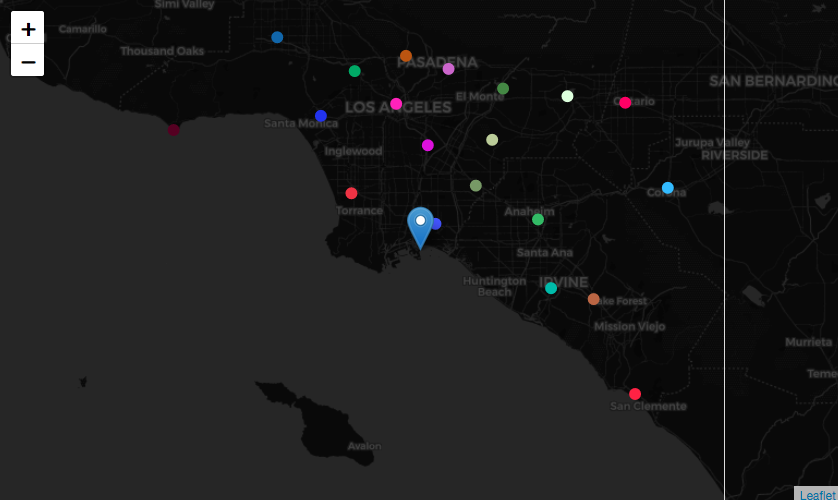

In [3]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('losangeles.png')

### 20 ближайших центров кластеров к городу Miami:

In [29]:
df = dfc[dfc['selected center latitude'] == 25.867736].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
73407,25.819542,-80.355330,419,28,25.845672,-80.318891,0.022674,25.867736,-80.324116
52762,25.788969,-80.226439,29,564,25.785812,-80.217938,0.134109,25.867736,-80.324116
82122,25.712601,-80.256995,167,80,25.705350,-80.283429,0.167406,25.867736,-80.324116
1344,26.011201,-80.149490,92,138,26.010098,-80.199991,0.188876,25.867736,-80.324116
55959,26.157174,-80.286226,320,38,26.138844,-80.334347,0.271301,25.867736,-80.324116
78937,26.160363,-80.138934,55,246,26.120863,-80.158907,0.302270,25.867736,-80.324116
230947,26.271192,-80.270604,159,42,26.200585,-80.250716,0.340846,25.867736,-80.324116
31124,26.358688,-80.083098,144,95,26.352571,-80.085279,0.540471,25.867736,-80.324116
24381,26.461462,-80.072820,293,43,26.488842,-80.070082,0.671049,25.867736,-80.324116
80213,26.715342,-80.053375,257,46,26.708358,-80.051922,0.883592,25.867736,-80.324116


Визуализируем возможные варианты размещения рекламных листовок:

In [30]:
maps = folium.Map(
    location=[25.867736, -80.324116], zoom_start=9, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[25.867736, -80.324116], popup='Miami').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapMiami.html')
maps

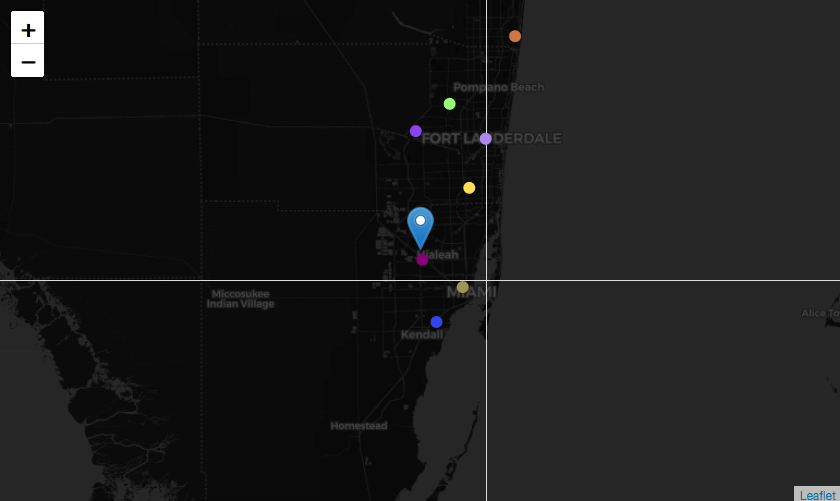

In [5]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('myami.png')

### 20 ближайших центров кластеров к городу London:

In [31]:
df = dfc[dfc['selected center latitude'] == 51.503016].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
64193,51.500152,-0.126236,58,254,51.502991,-0.125537,0.050058,51.503016,-0.075479
166774,48.856667,2.350987,188,66,48.857766,2.345798,3.586075,51.503016,-0.075479
276,53.344104,-6.267494,522,19,53.342887,-6.269303,6.461314,51.503016,-0.075479
113088,40.416691,-3.700345,546,18,40.417455,-3.700910,11.663336,51.503016,-0.075479


Визуализируем возможные варианты размещения рекламных листовок:

In [32]:
maps = folium.Map(
    location=[51.503016, -0.075479], zoom_start=10, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[51.503016, -0.075479], popup='London').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapLondon.html')
maps

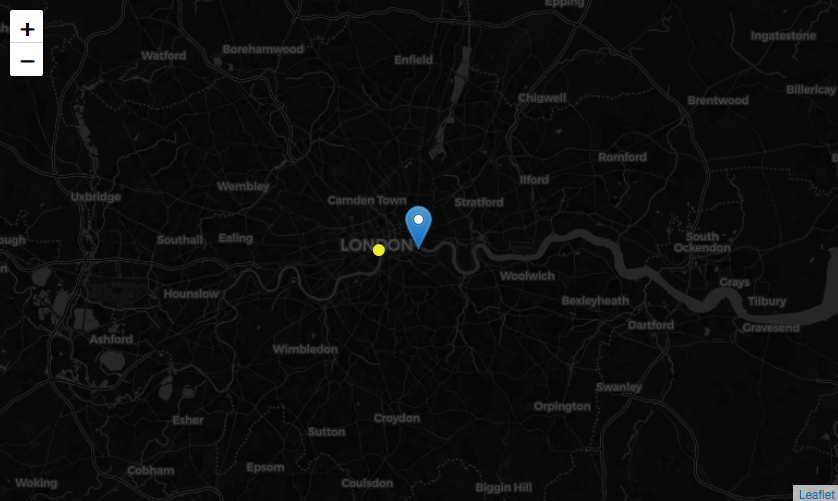

In [6]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('london.png')

### 20 ближайших центров кластеров к городу Amsterdam:

In [33]:
df = dfc[dfc['selected center latitude'] == 52.378894].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
86317,52.373056,4.892222,370,31,52.372964,4.892317,0.009353,52.378894,4.885084
212301,50.111512,8.680506,573,16,50.111512,8.680506,4.421114,52.378894,4.885084
128354,55.693403,12.583046,557,17,55.686826,12.589943,8.384942,52.378894,4.885084
48357,52.523405,13.411400,306,39,52.523405,13.411400,8.527540,52.378894,4.885084
4562,60.169845,24.938551,572,16,60.169954,24.937730,21.513001,52.378894,4.885084
153525,41.005270,28.976960,474,23,41.005270,28.976960,26.641656,52.378894,4.885084
124980,55.755786,37.617633,278,44,55.748350,37.623850,32.911701,52.378894,4.885084
59963,32.059925,34.785126,482,23,32.059502,34.788657,36.153857,52.378894,4.885084
60561,25.264444,55.311667,358,33,25.264444,55.311667,57.254114,52.378894,4.885084
231472,-0.301226,36.522964,103,120,-0.301226,36.522964,61.450391,52.378894,4.885084


Визуализируем возможные варианты размещения рекламных листовок:

In [34]:
maps = folium.Map(
    location=[52.378894, 4.885084], zoom_start=10, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[52.378894, 4.885084], popup='Amsterdam').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapAmsterdam.html')
maps

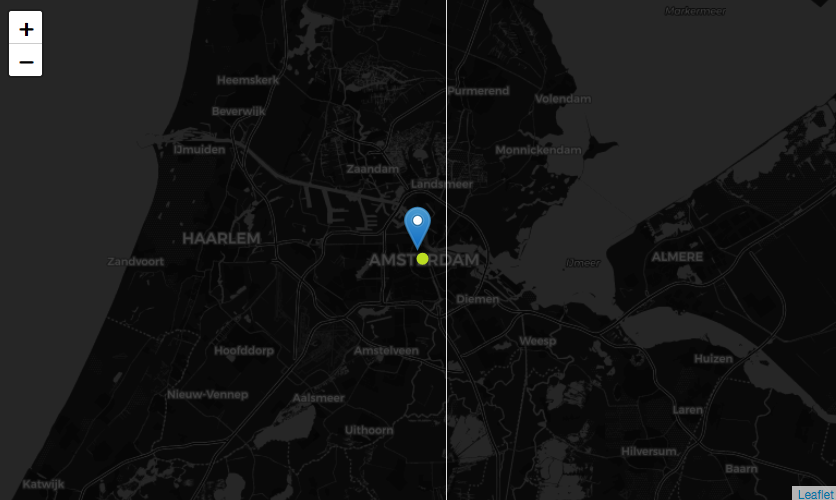

In [7]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('amsterdam.png')

### 20 ближайших центров кластеров к городу Beijing:

In [35]:
df = dfc[dfc['selected center latitude'] == 39.366487].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
126579,31.230393,121.473704,432,27,31.230393,121.473704,9.267575,39.366487,117.036146
193141,37.566535,126.977969,223,55,37.566535,126.977969,10.103449,39.366487,117.036146
73685,22.396428,114.109497,538,19,22.396428,114.109497,17.220574,39.366487,117.036146
80529,35.658068,139.751599,213,58,35.680006,139.706056,22.967694,39.366487,117.036146
194869,14.550000,121.033333,383,31,14.594446,121.015826,25.089676,39.366487,117.036146
226527,13.808475,100.569461,261,38,13.786798,100.615515,30.396671,39.366487,117.036146
179327,13.723419,100.476232,210,50,13.731011,100.513362,30.498853,39.366487,117.036146
142491,3.139003,101.686855,294,36,3.134276,101.675560,39.353789,39.366487,117.036146
213769,3.573906,98.730995,369,32,3.584888,98.677329,40.216526,39.366487,117.036146
37528,1.352083,103.819836,160,78,1.350837,103.820220,40.247365,39.366487,117.036146


Визуализируем возможные варианты размещения рекламных листовок:

In [36]:
maps = folium.Map(
    location=[39.366487, 117.036146], zoom_start=3, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[39.366487, 117.036146], popup='Beijing').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapBeijing.html')
maps

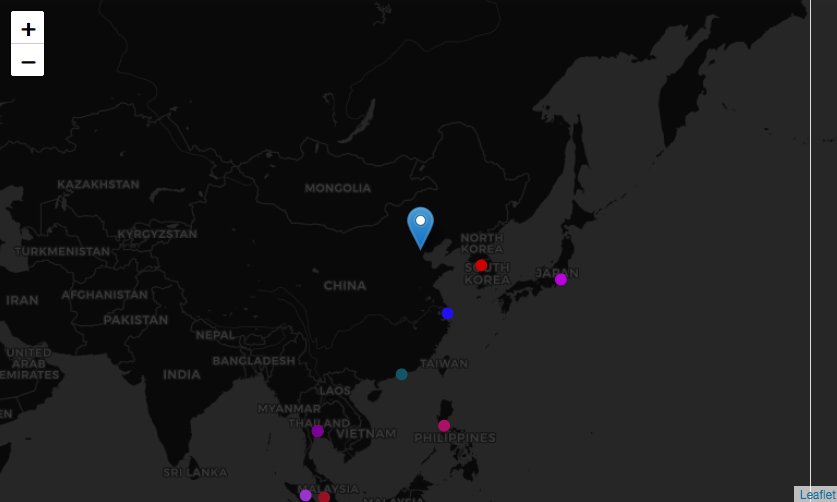

In [8]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('china.png')

### 20 ближайших центров кластеров к городу Sydney:

In [37]:
df = dfc[dfc['selected center latitude'] == -33.868457].drop_duplicates(
    ['center latitude', 'center longitude'])
df.head(20)

,latitude,longitude,cluster,volume,center latitude,center longitude,distanse,selected center latitude,selected center longitude
2042,-33.796076,151.183102,420,28,-33.860630,151.204776,0.007835,-33.868457,151.205134
56143,-37.813187,144.962980,483,23,-37.809054,144.966681,7.378794,-33.868457,151.205134
74861,-8.656290,115.222099,359,31,-8.664363,115.211340,43.940864,-33.868457,151.205134
194708,-7.265278,112.742500,252,49,-7.267715,112.741673,46.765770,-33.868457,151.205134


Визуализируем возможные варианты размещения рекламных листовок:

In [38]:
maps = folium.Map(
    location=[-33.868457, 151.205134], zoom_start=4, tiles='CartoDB dark_matter')
lat = df['center latitude'][:20]
lon = df['center longitude'][:20]
folium.Marker(location=[-33.868457, 151.205134], popup='Sydney').add_to(maps)
for lat, lon in zip(lat, lon):
    color = "#%03x" % random.randint(0, 0xFFF)
    folium.CircleMarker(location=[lat, lon], popup=str(lat)+' '+str(lon),
        radius = 4, fill_color=color, fill_opacity = 1, color=color).add_to(maps)
maps.save('mapSydney.html')
maps

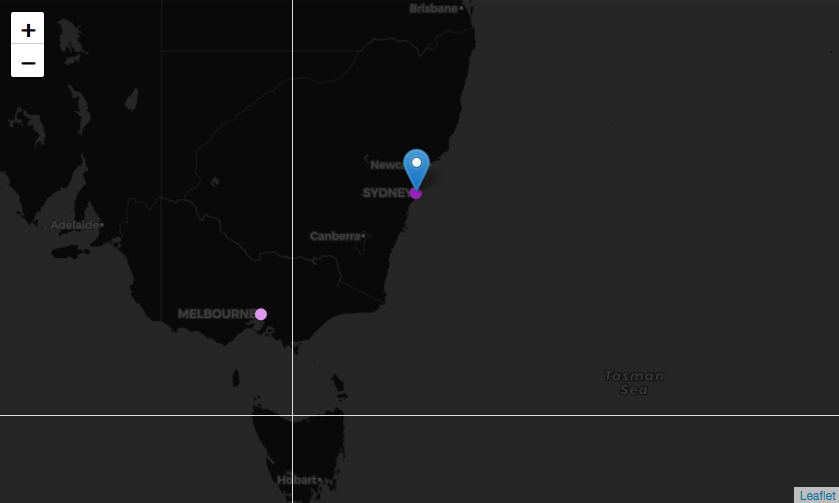

In [10]:
# Githab не отображет визуализацию folium, отобразим сохраненные изображения
Image('sydney.png')